In [1]:
import sys
sys.path.append('/SAN/colcc/Hormad1/projects/MINOTAUR')
sys.path.append('/SAN/colcc/Hormad1/projects/MINOTAUR/tiler')
import os
import glob

import numpy as np
import pandas as pd
import openslide
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

from loader import lmdb_io
from loader.lmdb_io import LMDBRead

In [2]:
def percentile_clip(x, lower=1, upper=99, eps=1e-8):
    low_val = np.percentile(x, lower)
    high_val = np.percentile(x, upper)
    x_clipped = np.clip(x, low_val, high_val)
    return (x_clipped - low_val) / (high_val - low_val + eps)

In [3]:
#attentions = np.load('/SAN/colcc/Hormad1/analysis/minotaur/attentions/attentions/TCGA-BRCA/1_TP/Stage/TCGA-BH-A0C1-01Z_True_attention.npy')
#keys = pd.read_csv('/SAN/colcc/Hormad1/analysis/minotaur/attentions/attentions/TCGA-BRCA/1_TP/Stage/TCGA-BH-A0C1-01Z_True_tile_keys.txt',delimiter='\t',header=None)

#attentions = np.load('/SAN/colcc/Hormad1/analysis/minotaur/attentions/attentions/TCGA-BRCA/1_TP')
#keys = pd.read_csv('/SAN/colcc/Hormad1/analysis/minotaur/attentions/attentions/TCGA-BRCA/1_TP/Stage/TCGA-BH-A0C1-01Z_True_tile_keys.txt',delimiter='\t',header=None)

In [4]:
def get_embeddings(p, ids):

    lmdb_read = LMDBRead(p)
    keys = lmdb_read.get_keys()
    attn_keys = [k for k in keys if k.decode('utf-8') in ids]

    vecs = []
    for k in attn_keys:
        ndarray = lmdb_read.read_ndarray(k)
        feature_vec = ndarray.get_ndarray()
        vecs.append(feature_vec)
        
    return np.stack(vecs)

In [5]:
def get_tsne(mat):
    tsne = TSNE(n_components=2,    
                perplexity=30,         
                learning_rate=200,
                n_iter=1000,
                random_state=42)
                #verbose=1)

    embedds_2d = tsne.fit_transform(mat)
    return embedds_2d

In [6]:
def paste_HE_on_tsne(tsne_df, wsi_path,
                     cluster_colors=None, max_dim=200, n_samples=500, 
                     image_size=(4000, 3000), random_state=42):

    norm = plt.Normalize(vmin=tsne_df['attentions'].min(), vmax=tsne_df['attentions'].max())
    cmap = plt.get_cmap('magma')  # or 'plasma', 'inferno', etc.

    random_df = tsne_df
    #random.seed(random_state)
    #random_df = tsne_df.groupby('Cluster').sample(n=n_samples, replace=True, random_state=random_state)
    #random_df = random_df.sample(frac=1, random_state=random_state).reset_index(drop=True)
    random_df.index = random_df['keys']

    tx, ty = random_df["tsne1"], random_df["tsne2"]
    tx = (tx - np.min(tx)) / (np.max(tx) - np.min(tx))
    ty = (ty - np.min(ty)) / (np.max(ty) - np.min(ty))

    width, height = image_size
    full_image = Image.new('RGBA', (width, height))
    
    for i, (patch_id, tsne_x, tsne_y, cluster_id) in enumerate(zip(random_df.index, tx, ty, random_df['name'])):

        print(f"\r{i}", end="", flush=True)
        
        try:
            wsi = openslide.OpenSlide(wsi_path)
            x, y = patch_id.split('_')
            x = int(x)
            y = int(y)
            patch_size = 224
            im = wsi.read_region((x, y), 1, (patch_size, patch_size)).convert("RGB")
        except Exception as e:
            print(f"Error processing WSI for patch {patch_id}: {e}")
            continue  # Skip this patch if there's an issue

        tile = Image.fromarray(np.array(im))
        rs = max(1, tile.width / max_dim, tile.height / max_dim)
        tile = tile.resize((int(tile.width / rs), int(tile.height / rs)))

        x_pos = int((width - max_dim) * tsne_x)
        y_pos = int((height - max_dim) * tsne_y)
    
        attention_value = tsne_df.loc[patch_id, 'attentions']
        rgba = cmap(norm(attention_value))  # returns tuple of (r, g, b, a) in 0–1
        border_color = tuple(int(255 * c) for c in rgba)  # convert to 0–255 RGB

        border_size = 7  # Set the thickness of the border
        tile_with_border = Image.new('RGBA', (tile.width + 2 * border_size, tile.height + 2 * border_size), border_color)
        tile_with_border.paste(tile, (border_size, border_size))  # Paste the original tile inside the border
        full_image.paste(tile_with_border, (x_pos, y_pos), mask=tile_with_border.convert('RGBA'))

    return full_image

In [7]:
def get_attn_df(paths):

    attn_paths = [p for p in paths if '.npy' in p]
    key_paths = [p for p in paths if 'keys' in p]
    print(len(attn_paths))

    embedds, wsi_df = [],  []
    for a_p in attn_paths:
        name = os.path.basename(a_p).split('_')[0]
        k_p = [k for k in key_paths if name in k][0]    
        attentions = np.load(a_p,allow_pickle=True)
        attn_norm = percentile_clip(attentions)
        keys = pd.read_csv(k_p, delimiter='\t', header=None)
        
        attn_df = pd.DataFrame(
                {
                'keys': keys[0], 
                'attentions': attentions, 
                'attn_norm':attn_norm,
                'name': [name]*len(attn_norm)}
            )
        
        attn_df['keys'] = attn_df['keys'].apply(lambda x: x[2:-1])
        
        em_path = os.path.join(EMBED_PATH, name)  
        embedds.append(get_embeddings(em_path, list(attn_df['keys'])))

        wsi_df.append(attn_df)

    df = pd.concat(wsi_df, ignore_index=True) 
    all_embedds = np.vstack(embedds)

    emb_cols = [f'emb_{i}' for i in range(all_embedds.shape[1])]
    df_emb = pd.DataFrame(all_embedds.astype('float32'),
                      index=df.index, columns=emb_cols)

    df_attn_embedds = pd.concat([df, df_emb], axis=1)

    return df_attn_embedds

In [8]:
def get_tsne_attn_grads(df):

    fig, ax = plt.subplots(1, 5,figsize=(20,3))
    names = list(set(df['name']))
    for i, n in enumerate(names):
        print(i)
        pt_df = df[df['name']==n]
        emb_cols = [c for c in pt_df.columns if 'emb_' in c]
        X = pt_df[emb_cols].to_numpy(dtype=np.float32)
        #X = PCA(n_components=min(50, X.shape[1]), random_state=2).fit_transform(X)
        tsne_2d = get_tsne(X)
    
        pt_df['tsne1'] = tsne_2d[:, 0]
        pt_df['tsne2'] = tsne_2d[:, 1]
        
        sc = ax[i].scatter(
            pt_df['tsne1'], pt_df['tsne2'],
            c=pt_df['attentions'],  
            cmap='magma',      
            s=6, alpha=0.9, rasterized=True
        )

        ax[i].set(title=n, xlabel='t-SNE 1', ylabel='t-SNE 2')
        
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label("Attention Score")
    
    #plt.tight_layout()
    plt.show()

In [9]:
def get_tsne_tile_overlay(df, X, t_overlay):

    fig, ax = plt.subplots(1, 1,figsize=(5,3))
    sc = ax.scatter(
        df['tsne1'], df['tsne2'],
        c=df['attn_norm'],  
        cmap='magma',      
        s=6, alpha=0.9, rasterized=True
    )

    ax.set(title=list(df['name'])[0], xlabel='t-SNE 1', ylabel='t-SNE 2')
    cbar = plt.colorbar(sc, ax=ax)
    #cbar.set_label("Attention Score")

    #ax[1].imshow(image)

    plt.show()

## TCGA BRCA - sampling multiple patients

In [10]:
#paths = glob.glob('/SAN/colcc/Hormad1/analysis/minotaur/attentions/attentions/TCGA-BRCA/1_TP/Cancer/*')
paths = glob.glob('/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/1_TP/RNA_Bio_bin/*')
paths = [p for p in paths if 'True' in p]
attn_paths = [p for p in paths if '.npy' in p]
key_paths = [p for p in paths if 'keys' in p]

In [11]:
EMBED_PATH = '/SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/'

In [6]:
embedds = []
wsi_df = []

for a_p in attn_paths:
    name = os.path.basename(a_p).split('_')[0]
    k_p = [k for k in key_paths if name in k][0]    
    attentions = np.load(a_p,allow_pickle=True)
    attn_norm = percentile_clip(attentions)
    keys = pd.read_csv(k_p, delimiter='\t', header=None)
    
    df = pd.DataFrame(
            {
            'keys': keys[0], 
            'attentions': attentions, 
            'attn_norm':attn_norm,
            'name': [name]*len(attn_norm)}
        )
    
    df['keys']=df['keys'].apply(lambda x: x[2:-1])
    wsi_df.append(df)
    
    em_path = os.path.join(EMBED_PATH, name)
    print(f'embedding path: {em_path}')   
    embedds.append(get_embeddings(em_path, list(df['keys'])))
    
brca_tp_df = pd.concat(wsi_df, ignore_index=True) 
test = np.vstack(embedds)

embedding path: /SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/TCGA-BH-A42T-01Z


NameError: name 'get_embeddings' is not defined

In [ ]:
emb_cols = [f'emb_{i}' for i in range(test.shape[1])]
df_emb = pd.DataFrame(test.astype('float32'),
                      index=brca_tp_df.index, columns=emb_cols)

brca_tp_df = pd.concat([brca_tp_df, df_emb], axis=1)
sample = brca_tp_df.sample(n=5000, random_state=42)

In [ ]:
emb_cols = [c for c in sample.columns if 'emb_' in c]
X = sample[emb_cols].to_numpy(dtype=np.float32)
X = PCA(n_components=min(50, X.shape[1]), random_state=2).fit_transform(X)

In [ ]:
tsne = TSNE(n_components=2)

ts = tsne.fit_transform(X)
    
sample['tsne1'] = ts[:, 0]
sample['tsne2'] = ts[:, 1]

labels = sorted(sample['name'].unique())
cmap = plt.get_cmap('tab20', len(labels))

ig, ax = plt.subplots(figsize=(8,6))
for i, c in enumerate(labels):
    m = sample['name'] == c
    ax.scatter(
        sample.loc[m, 'tsne1'], sample.loc[m, 'tsne2'],
        s=6, alpha=0.9, label=str(c), color=cmap(i), rasterized=True
    )

ax.set(title='t-SNE by cluster', xlabel='t-SNE 1', ylabel='t-SNE 2')
ax.legend(title='Cluster', markerscale=2, frameon=False, ncol=2)
plt.tight_layout()
plt.show()

### TCGA-BRCA - single gradient

In [18]:
EMBED_PATH = '/SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/'

#paths = glob.glob('/SAN/colcc/Hormad1/analysis/minotaur/attentions/attentions/TCGA-BRCA/1_TP/Cancer/*')
paths = glob.glob('/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/0_TN/Cancer/*')
paths = [p for p in paths if 'TCGA-AR-A24Q-01Z' in p]
print(paths)

cancer_df = get_attn_df(paths)
#get_tsne_attn_grads(cancer_df)

['/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/0_TN/Cancer/TCGA-AR-A24Q-01Z_True_attention.npy', '/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/0_TN/Cancer/TCGA-AR-A24Q-01Z_True_tile_keys.txt']
1


In [20]:
wsi_path1 = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-AR-A24Q-01Z-00-DX1.69DC7E35-DC0D-4F20-88DA-04C25F28628C.svs'

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


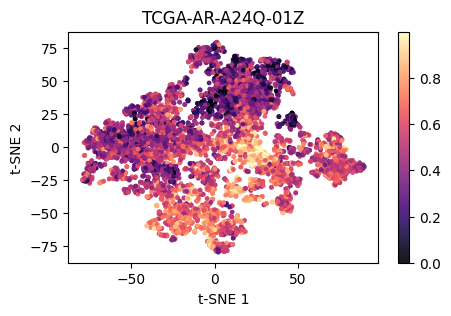

In [21]:
names = list(set(cancer_df['name']))
for n in names:
    pt_df = cancer_df[cancer_df['name']==n]
    emb_cols = [c for c in pt_df.columns if 'emb_' in c]
    X = pt_df[emb_cols].to_numpy(dtype=np.float32)
    
    tsne_2d = get_tsne(X)
    pt_df['tsne1'] = tsne_2d[:, 0]
    pt_df['tsne2'] = tsne_2d[:, 1]

    get_tsne_tile_overlay(pt_df, X, None)

In [23]:
WSI_PATH = '/SAN/colcc/Hormad1/data/WSIs/pantcga'

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


6474

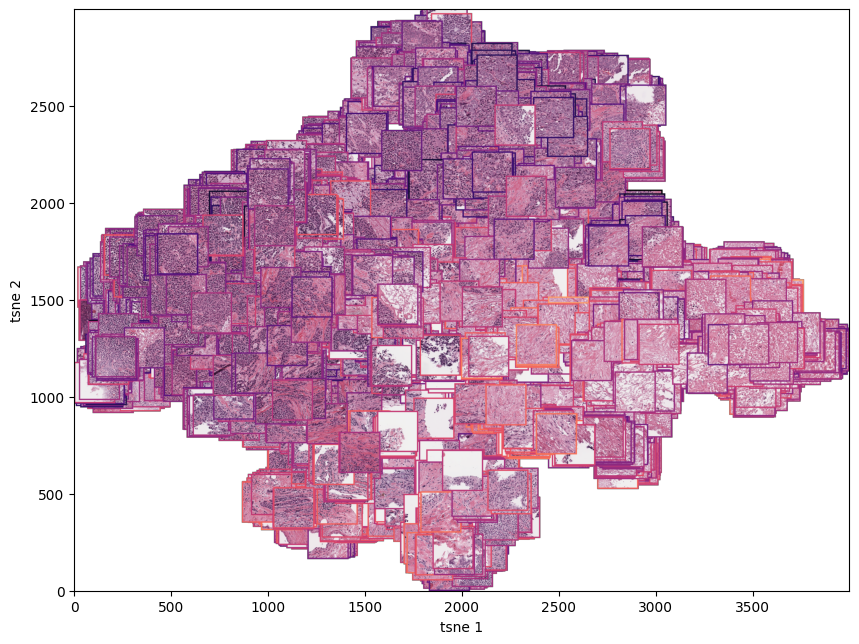

In [24]:
for n in names:
    pattern = os.path.join(WSI_PATH, n + '*')
    wsi_path = glob.glob(pattern)[0]

    pt_df = cancer_df[cancer_df['name']==n]

    emb_cols = [c for c in pt_df.columns if 'emb_' in c]
    X = pt_df[emb_cols].to_numpy(dtype=np.float32)

    tsne_2d = get_tsne(X)
    pt_df['tsne1'] = tsne_2d[:, 0]
    pt_df['tsne2'] = tsne_2d[:, 1]

    
    image = paste_HE_on_tsne(pt_df, wsi_path)

    plt.figure(figsize=(10, 8))
    plt.imshow(image)
    plt.xlabel("tsne 1")
    plt.ylabel("tsne 2")
    plt.gca().invert_yaxis()  
    #save_pt = f"{save_prefix}_tsne_HEoverlay_newcolor_border20.png"
    #plt.savefig(fname = save_pt, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

#### Cancer

In [12]:
EMBED_PATH = '/SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/'

#paths = glob.glob('/SAN/colcc/Hormad1/analysis/minotaur/attentions/attentions/TCGA-BRCA/1_TP/Cancer/*')
paths = glob.glob('/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/1_TP/RNA_Bio_bin/*')
paths = [p for p in paths if 'True' in p]

cancer_df = get_attn_df(paths)
#get_tsne_attn_grads(cancer_df)

6


In [44]:
wsi_path1 = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-BH-A0C1-01Z-00-DX1.21FE357E-B182-4397-BFEF-7E96E994236A.svs'
wsi_path2 = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-BH-A42T-01Z-00-DX1.6E4609B9-BE7E-4CA9-A1C0-A77A7DEFBB2B.svs'
wsi_path3 = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-A2-A0SW-01Z-00-DX1.E1EA0407-B831-4D75-826E-80B82B821797.svs'
wsi_path4 = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-A1-A0SK-01Z-00-DX1.A44D70FA-4D96-43F4-9DD7-A61535786297.svs'
wsi_path5 = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-BH-A1F0-01Z-00-DX1.E1557A67-230A-4337-AEC8-158258A917FF.svs'

In [70]:
WSI_PATH = '/SAN/colcc/Hormad1/data/WSIs/pantcga'

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/5853149.1.gpu.q/ipykernel_11502/249842213.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5853149.1.gpu.q/ipykernel_11502/249842213.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


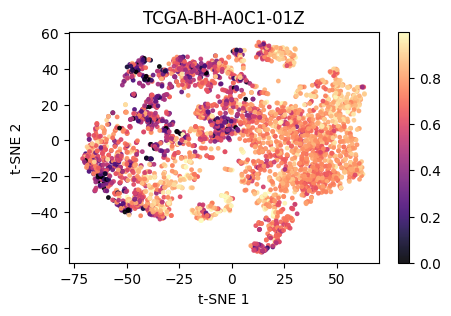

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/5853149.1.gpu.q/ipykernel_11502/249842213.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5853149.1.gpu.q/ipykernel_11502/249842213.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


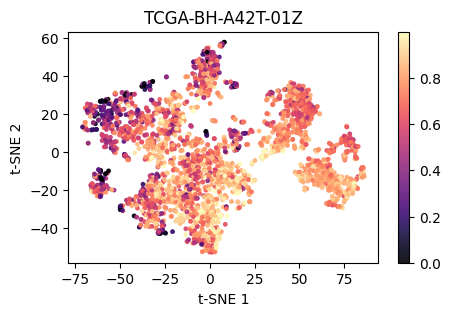

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/5853149.1.gpu.q/ipykernel_11502/249842213.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5853149.1.gpu.q/ipykernel_11502/249842213.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


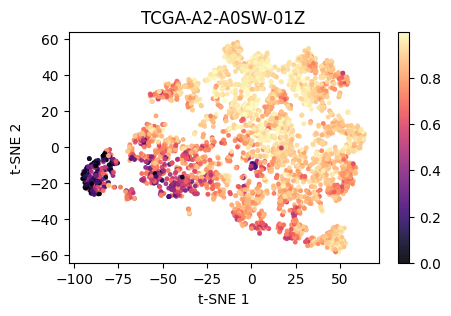

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/5853149.1.gpu.q/ipykernel_11502/249842213.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5853149.1.gpu.q/ipykernel_11502/249842213.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


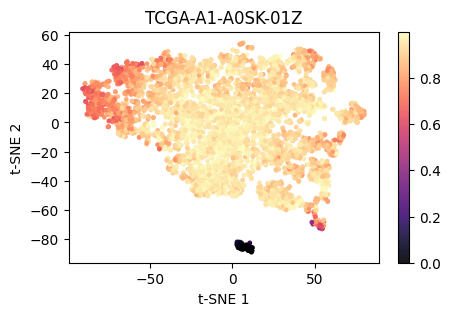

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/5853149.1.gpu.q/ipykernel_11502/249842213.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5853149.1.gpu.q/ipykernel_11502/249842213.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


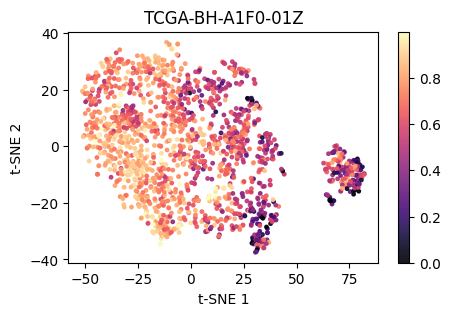

In [72]:
names = list(set(cancer_df['name']))
for n in names:
    pt_df = cancer_df[cancer_df['name']==n]
    emb_cols = [c for c in pt_df.columns if 'emb_' in c]
    X = pt_df[emb_cols].to_numpy(dtype=np.float32)
    
    tsne_2d = get_tsne(X)
    pt_df['tsne1'] = tsne_2d[:, 0]
    pt_df['tsne2'] = tsne_2d[:, 1]

    get_tsne_tile_overlay(pt_df, X, None)

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


0

/tmp/5853149.1.gpu.q/ipykernel_11502/1022867663.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5853149.1.gpu.q/ipykernel_11502/1022867663.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


3238

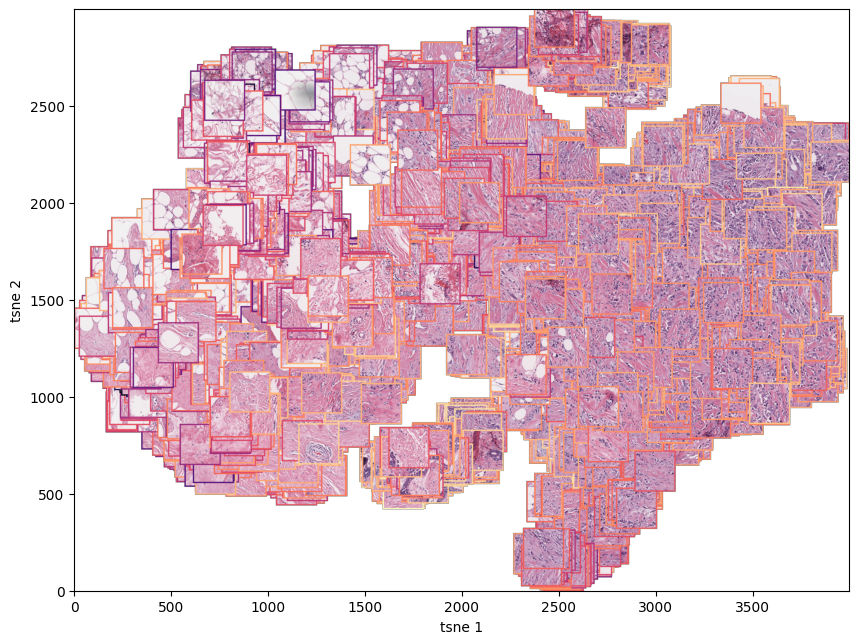

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


0

/tmp/5853149.1.gpu.q/ipykernel_11502/1022867663.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5853149.1.gpu.q/ipykernel_11502/1022867663.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


2676

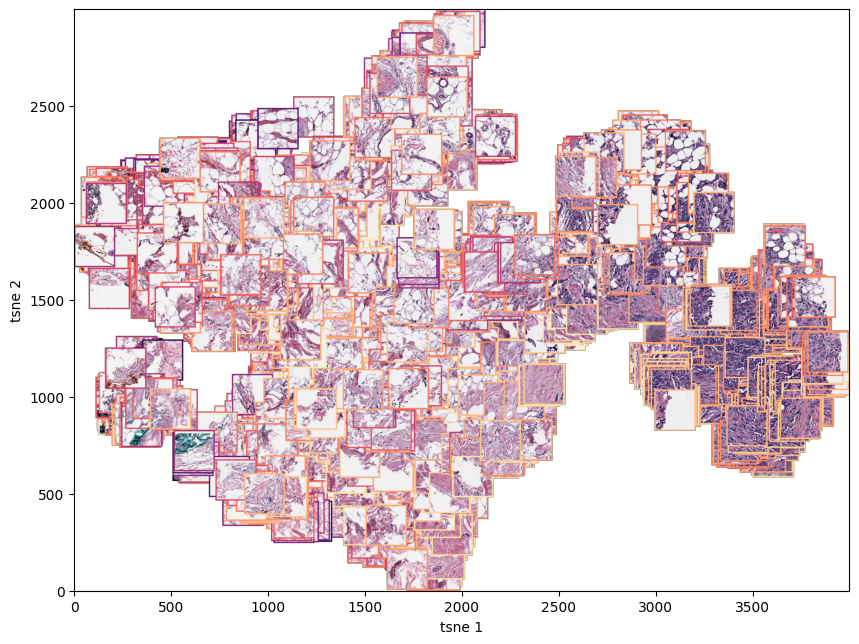

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


0

/tmp/5853149.1.gpu.q/ipykernel_11502/1022867663.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5853149.1.gpu.q/ipykernel_11502/1022867663.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


3558

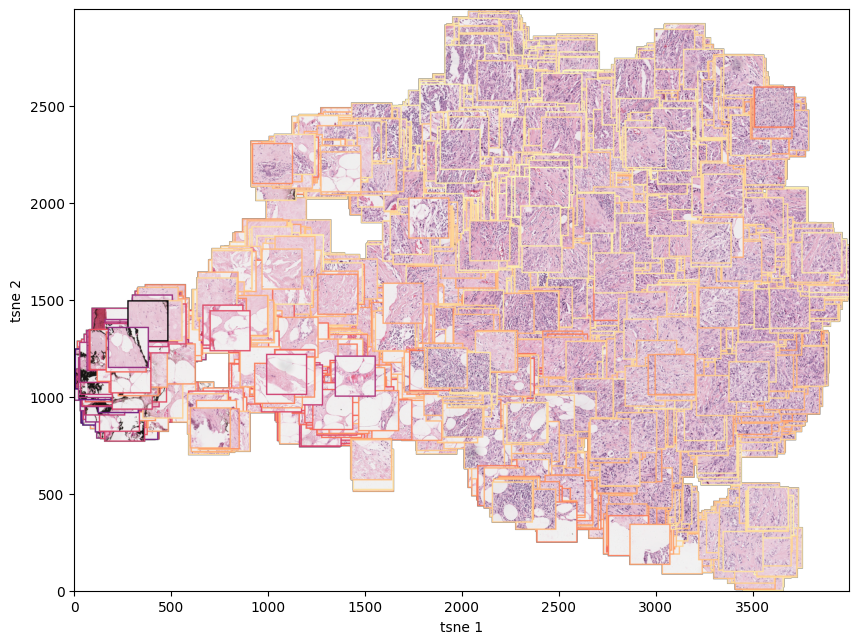

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


0

/tmp/5853149.1.gpu.q/ipykernel_11502/1022867663.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5853149.1.gpu.q/ipykernel_11502/1022867663.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


5463

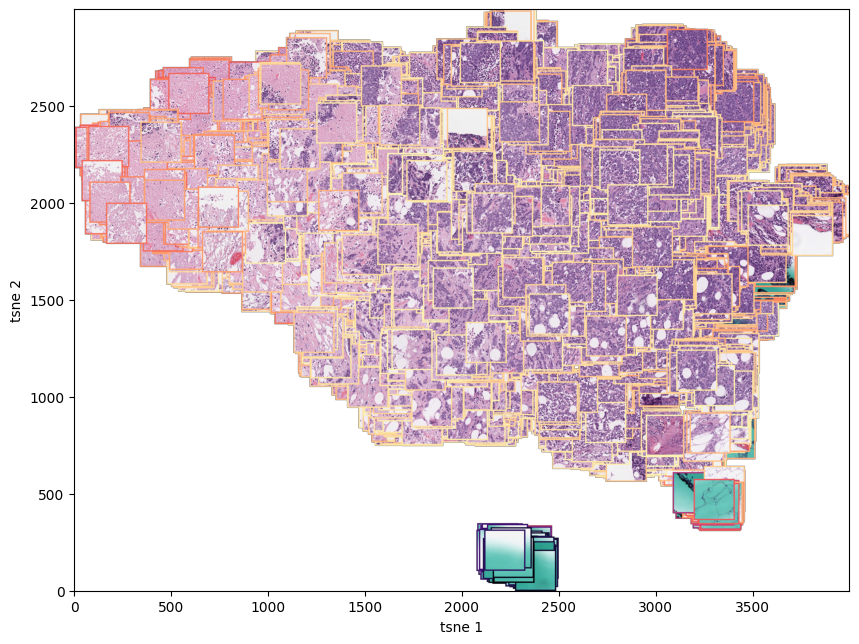

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


0

/tmp/5853149.1.gpu.q/ipykernel_11502/1022867663.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5853149.1.gpu.q/ipykernel_11502/1022867663.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


1531

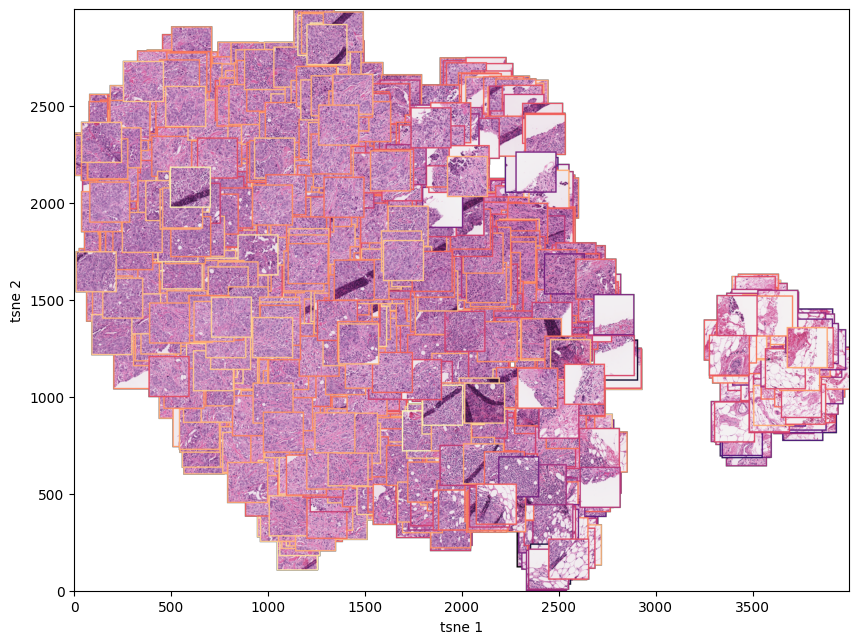

In [76]:
for n in names:
    pattern = os.path.join(WSI_PATH, n + '*')
    wsi_path = glob.glob(pattern)[0]

    pt_df = cancer_df[cancer_df['name']==n]

    emb_cols = [c for c in pt_df.columns if 'emb_' in c]
    X = pt_df[emb_cols].to_numpy(dtype=np.float32)

    tsne_2d = get_tsne(X)
    pt_df['tsne1'] = tsne_2d[:, 0]
    pt_df['tsne2'] = tsne_2d[:, 1]

    
    image = paste_HE_on_tsne(pt_df, wsi_path)

    plt.figure(figsize=(10, 8))
    plt.imshow(image)
    plt.xlabel("tsne 1")
    plt.ylabel("tsne 2")
    plt.gca().invert_yaxis()  
    #save_pt = f"{save_prefix}_tsne_HEoverlay_newcolor_border20.png"
    #plt.savefig(fname = save_pt, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

#### RNA-Bio

In [13]:
EMBED_PATH = '/SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/'

#paths = glob.glob('/SAN/colcc/Hormad1/analysis/minotaur/attentions/attentions/TCGA-BRCA/1_TP/Cancer/*')
paths = glob.glob('/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/1_TP/RNA_Bio_bin/*')
paths = [p for p in paths if 'True' in p]

cancer_df = get_attn_df(paths)
#get_tsne_attn_grads(cancer_df)

6


In [14]:
paths

['/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/1_TP/RNA_Bio_bin/TCGA-BH-A42T-01Z_True_attention.npy',
 '/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/1_TP/RNA_Bio_bin/TCGA-BH-A42T-01Z_True_tile_keys.txt',
 '/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/1_TP/RNA_Bio_bin/TCGA-B6-A0I6-01Z_True_attention.npy',
 '/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/1_TP/RNA_Bio_bin/TCGA-B6-A0I6-01Z_True_tile_keys.txt',
 '/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/1_TP/RNA_Bio_bin/TCGA-AC-A62V-01Z_True_attention.npy',
 '/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/1_TP/RNA_Bio_bin/TCGA-AC-A62V-01Z_True_tile_keys.txt',
 '/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/1_TP/RNA_Bio_bin/TCGA-AR-A5QQ-01Z_True_attention.npy',
 '/SAN/colcc/Hormad1/analysis/minotaur/attentions2/attentions/TCGA-BRCA/1_TP/RNA_Bio_bin/TCGA-AR-A5QQ-01Z_True_

In [16]:
wsi_path1 = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-B6-A0I6-01Z-00-DX1.D597D207-BEB2-4CE5-B315-FE7AD6E9C30B.svs'
wsi_path2 = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-BH-A42T-01Z-00-DX1.6E4609B9-BE7E-4CA9-A1C0-A77A7DEFBB2B.svs'
wsi_path3 = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-AC-A62V-01Z-00-DX1.2D8994FD-58B8-43C1-B99D-AA964E7DFD60.svs'
wsi_path4 = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-AR-A5QQ-01Z-00-DX1.4185D6D2-498E-4E71-8CB3-EDB4739C6229.svs'
wsi_path5 = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-BH-A1F0-01Z-00-DX1.E1557A67-230A-4337-AEC8-158258A917FF.svs'
wsi_path6 = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-A1-A0SK-01Z-00-DX1.A44D70FA-4D96-43F4-9DD7-A61535786297.svs'

In [17]:
WSI_PATH = '/SAN/colcc/Hormad1/data/WSIs/pantcga'

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/5881719.1.gpu.q/ipykernel_18089/249842213.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5881719.1.gpu.q/ipykernel_18089/249842213.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


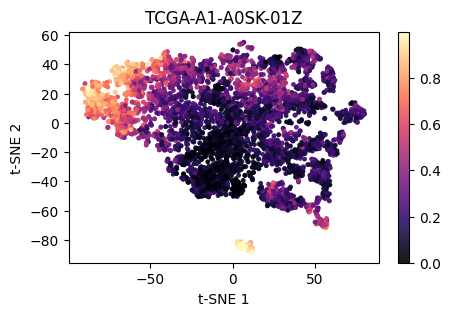

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/5881719.1.gpu.q/ipykernel_18089/249842213.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5881719.1.gpu.q/ipykernel_18089/249842213.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


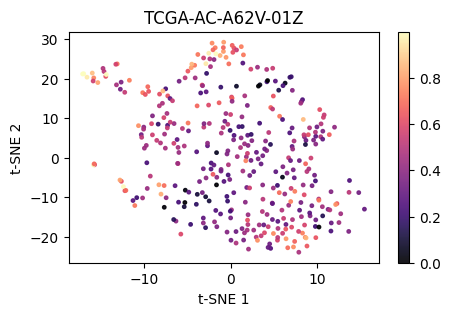

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/5881719.1.gpu.q/ipykernel_18089/249842213.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5881719.1.gpu.q/ipykernel_18089/249842213.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


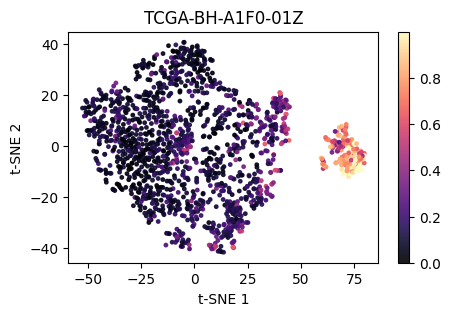

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/5881719.1.gpu.q/ipykernel_18089/249842213.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5881719.1.gpu.q/ipykernel_18089/249842213.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


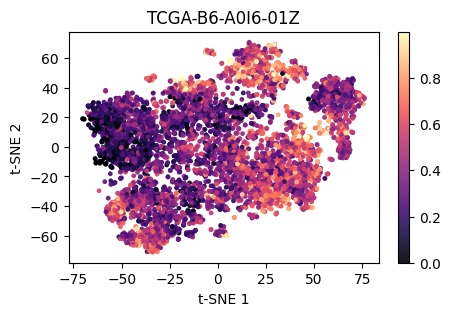

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/5881719.1.gpu.q/ipykernel_18089/249842213.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5881719.1.gpu.q/ipykernel_18089/249842213.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


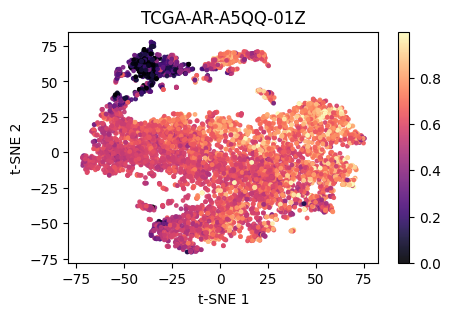

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/5881719.1.gpu.q/ipykernel_18089/249842213.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5881719.1.gpu.q/ipykernel_18089/249842213.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


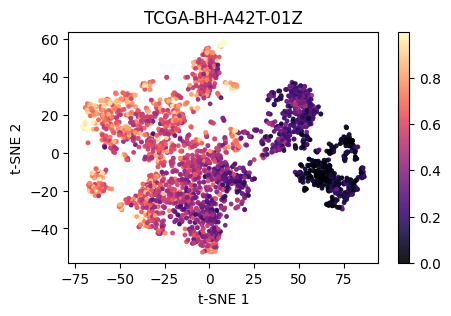

In [18]:
names = list(set(cancer_df['name']))
for n in names:
    pt_df = cancer_df[cancer_df['name']==n]
    emb_cols = [c for c in pt_df.columns if 'emb_' in c]
    X = pt_df[emb_cols].to_numpy(dtype=np.float32)
    
    tsne_2d = get_tsne(X)
    pt_df['tsne1'] = tsne_2d[:, 0]
    pt_df['tsne2'] = tsne_2d[:, 1]

    get_tsne_tile_overlay(pt_df, X, None)

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


0

/tmp/5881719.1.gpu.q/ipykernel_18089/1022867663.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5881719.1.gpu.q/ipykernel_18089/1022867663.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


5463

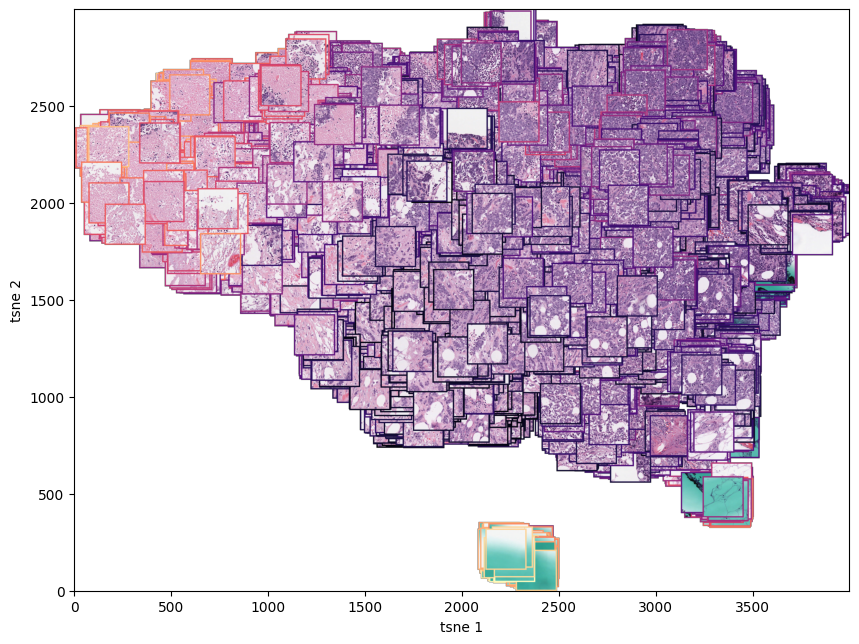

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


0

/tmp/5881719.1.gpu.q/ipykernel_18089/1022867663.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5881719.1.gpu.q/ipykernel_18089/1022867663.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


374

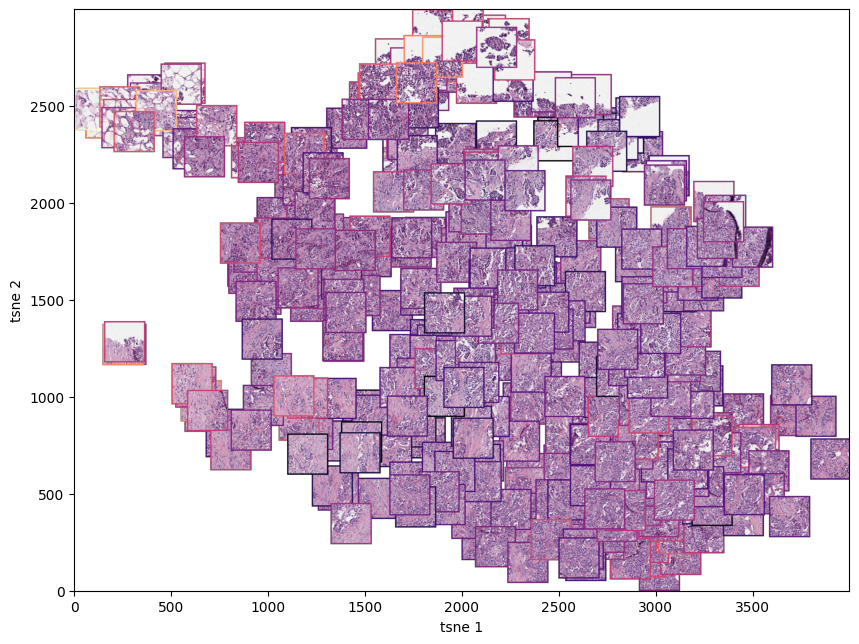

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


0

/tmp/5881719.1.gpu.q/ipykernel_18089/1022867663.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5881719.1.gpu.q/ipykernel_18089/1022867663.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


1531

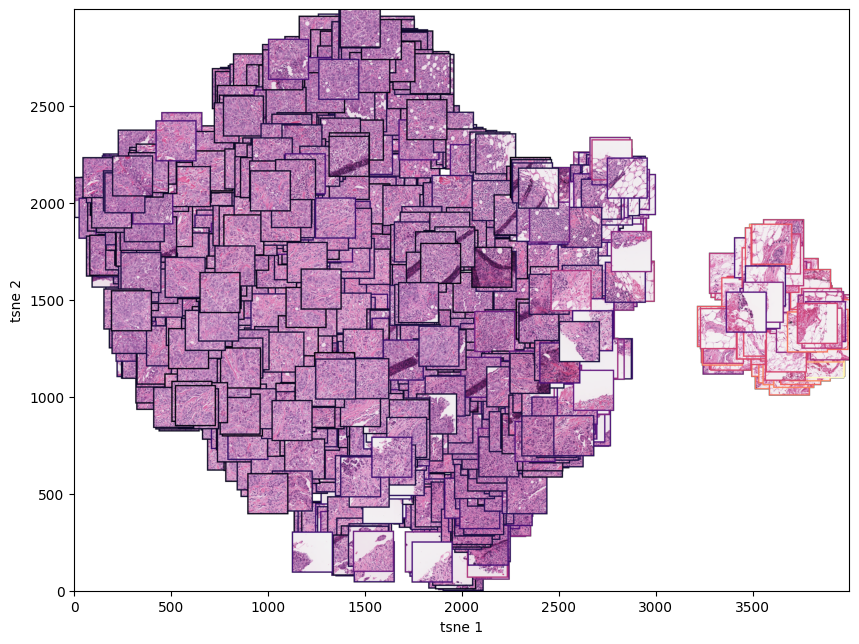

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


0

/tmp/5881719.1.gpu.q/ipykernel_18089/1022867663.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5881719.1.gpu.q/ipykernel_18089/1022867663.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


6089

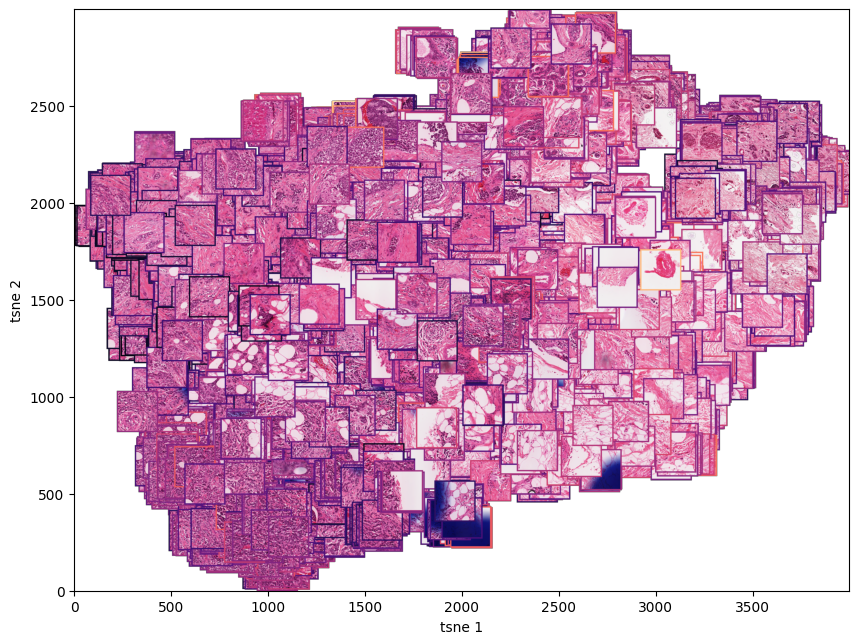

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


0

/tmp/5881719.1.gpu.q/ipykernel_18089/1022867663.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5881719.1.gpu.q/ipykernel_18089/1022867663.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


6120

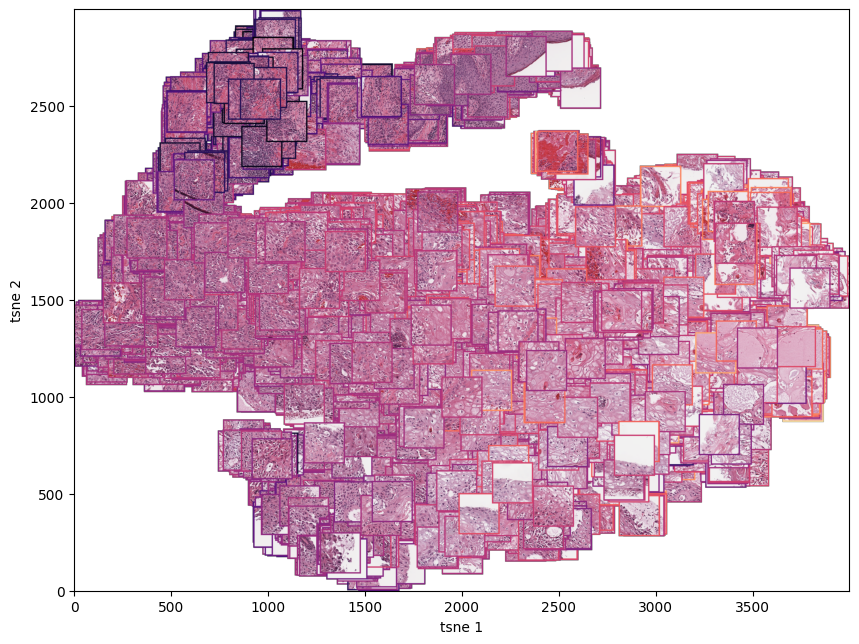

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


0

/tmp/5881719.1.gpu.q/ipykernel_18089/1022867663.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5881719.1.gpu.q/ipykernel_18089/1022867663.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


3

In [ ]:
for n in names:
    pattern = os.path.join(WSI_PATH, n + '*')
    wsi_path = glob.glob(pattern)[0]

    pt_df = cancer_df[cancer_df['name']==n]

    emb_cols = [c for c in pt_df.columns if 'emb_' in c]
    X = pt_df[emb_cols].to_numpy(dtype=np.float32)

    tsne_2d = get_tsne(X)
    pt_df['tsne1'] = tsne_2d[:, 0]
    pt_df['tsne2'] = tsne_2d[:, 1]

    
    image = paste_HE_on_tsne(pt_df, wsi_path)

    plt.figure(figsize=(10, 8))
    plt.imshow(image)
    plt.xlabel("tsne 1")
    plt.ylabel("tsne 2")
    plt.gca().invert_yaxis()  
    #save_pt = f"{save_prefix}_tsne_HEoverlay_newcolor_border20.png"
    #plt.savefig(fname = save_pt, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

#### Stage

In [78]:
EMBED_PATH = '/SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/'
paths = glob.glob('/SAN/colcc/Hormad1/analysis/minotaur/attentions/attentions/TCGA-BRCA/1_TP/Stage/*')
paths = [p for p in paths if 'True' in p]

stage_df = get_attn_df(paths)
#get_tsne_attn_grads(stage_df)

3


In [77]:
WSI_PATH = '/SAN/colcc/Hormad1/data/WSIs/pantcga'

In [ ]:
names = list(set(stage_df['name']))
for n in names:
    pt_df = cancer_df[cancer_df['name']==n]
    emb_cols = [c for c in pt_df.columns if 'emb_' in c]
    X = pt_df[emb_cols].to_numpy(dtype=np.float32)
    
    tsne_2d = get_tsne(X)
    pt_df['tsne1'] = tsne_2d[:, 0]
    pt_df['tsne2'] = tsne_2d[:, 1]

    get_tsne_tile_overlay(pt_df, X, None)

In [83]:
names = list(set(stage_df['name']))
names

['TCGA-AC-A62V-01Z', 'TCGA-BH-A0C1-01Z', 'TCGA-A1-A0SK-01Z']

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


0

/tmp/5853149.1.gpu.q/ipykernel_11502/3345194400.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne1'] = tsne_2d[:, 0]
/tmp/5853149.1.gpu.q/ipykernel_11502/3345194400.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pt_df['tsne2'] = tsne_2d[:, 1]


3238

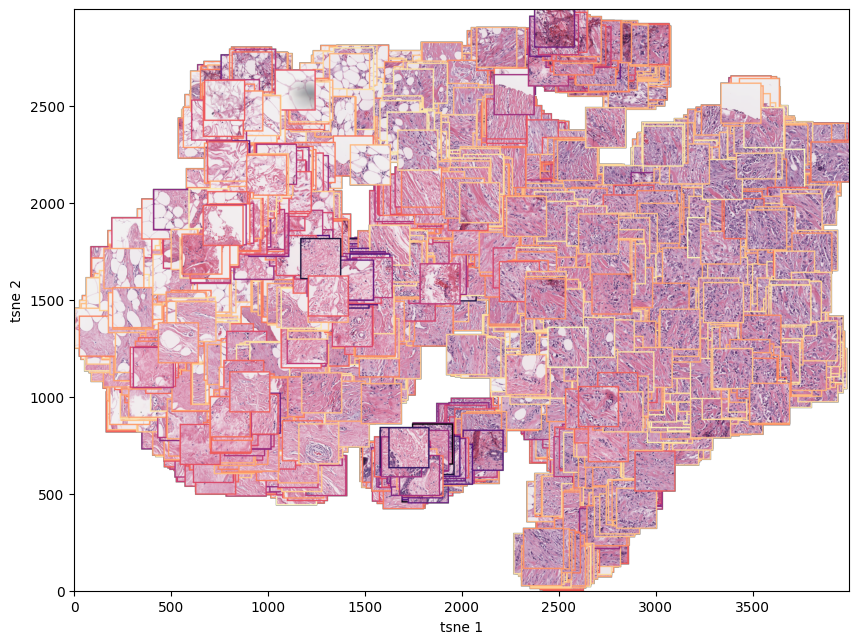

In [84]:
for n in names[1:2]:
    pattern = os.path.join(WSI_PATH, n + '*')
    wsi_path = glob.glob(pattern)[0]

    pt_df = stage_df[stage_df['name']==n]

    emb_cols = [c for c in pt_df.columns if 'emb_' in c]
    X = pt_df[emb_cols].to_numpy(dtype=np.float32)
    try:
        tsne_2d = get_tsne(X)
    except:
        continue
    pt_df['tsne1'] = tsne_2d[:, 0]
    pt_df['tsne2'] = tsne_2d[:, 1]

    
    image = paste_HE_on_tsne(pt_df, wsi_path)

    plt.figure(figsize=(10, 8))
    plt.imshow(image)
    plt.xlabel("tsne 1")
    plt.ylabel("tsne 2")
    plt.gca().invert_yaxis()  
    #save_pt = f"{save_prefix}_tsne_HEoverlay_newcolor_border20.png"
    #plt.savefig(fname = save_pt, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

#### Age

1
0


/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


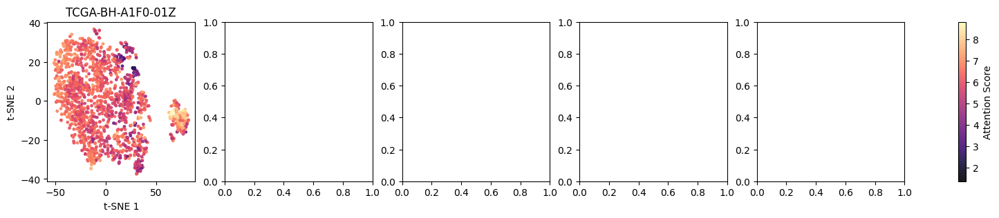

In [35]:
EMBED_PATH = '/SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/'
paths = glob.glob('/SAN/colcc/Hormad1/analysis/minotaur/attentions/attentions/TCGA-BRCA/1_TP/Age/*')
paths = [p for p in paths if 'True' in p]
paths
#stage_df = get_attn_df(paths)
#get_tsne_attn_grads(stage_df)

#### TCGA-BRCA - Overlay

In [93]:
def paste_HE_on_tsne(tsne_df, wsi_path,
                     cluster_colors=None, max_dim=200, n_samples=500, 
                     image_size=(4000, 3000), random_state=42):

    norm = plt.Normalize(vmin=tsne_df['attentions'].min(), vmax=tsne_df['attentions'].max())
    cmap = plt.get_cmap('magma')  # or 'plasma', 'inferno', etc.

    random_df = tsne_df
    #random.seed(random_state)
    #random_df = tsne_df.groupby('Cluster').sample(n=n_samples, replace=True, random_state=random_state)
    #random_df = random_df.sample(frac=1, random_state=random_state).reset_index(drop=True)
    random_df.index = random_df['keys']

    tx, ty = random_df["tsne1"], random_df["tsne2"]
    tx = (tx - np.min(tx)) / (np.max(tx) - np.min(tx))
    ty = (ty - np.min(ty)) / (np.max(ty) - np.min(ty))

    width, height = image_size
    full_image = Image.new('RGBA', (width, height))
    
    for i, (patch_id, tsne_x, tsne_y, cluster_id) in enumerate(zip(random_df.index, tx, ty, random_df['name'])):

        print(f"\r{i}", end="", flush=True)
        
        try:
            wsi = openslide.OpenSlide(wsi_path)
            x, y = patch_id.split('_')
            x = int(x)
            y = int(y)
            patch_size = 224
            im = wsi.read_region((x, y), 1, (patch_size, patch_size)).convert("RGB")
        except Exception as e:
            print(f"Error processing WSI for patch {patch_id}: {e}")
            continue  # Skip this patch if there's an issue

        tile = Image.fromarray(np.array(im))
        rs = max(1, tile.width / max_dim, tile.height / max_dim)
        tile = tile.resize((int(tile.width / rs), int(tile.height / rs)))

        x_pos = int((width - max_dim) * tsne_x)
        y_pos = int((height - max_dim) * tsne_y)
    
        attention_value = tsne_df.loc[patch_id, 'attentions']
        rgba = cmap(norm(attention_value))  # returns tuple of (r, g, b, a) in 0–1
        border_color = tuple(int(255 * c) for c in rgba)  # convert to 0–255 RGB

        border_size = 7  # Set the thickness of the border
        tile_with_border = Image.new('RGBA', (tile.width + 2 * border_size, tile.height + 2 * border_size), border_color)
        tile_with_border.paste(tile, (border_size, border_size))  # Paste the original tile inside the border
        full_image.paste(tile_with_border, (x_pos, y_pos), mask=tile_with_border.convert('RGBA'))

    return full_image

In [79]:
EMBED_PATH = '/SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/'

In [80]:
embedds = []
wsi_df = []

for a_p in attn_paths:
    name = os.path.basename(a_p).split('_')[0]
    k_p = [k for k in key_paths if name in k][0]    
    attentions = np.load(a_p,allow_pickle=True)
    attn_norm = percentile_clip(attentions)
    keys = pd.read_csv(k_p, delimiter='\t', header=None)
    
    df = pd.DataFrame(
            {
            'keys': keys[0], 
            'attentions': attentions, 
            'attn_norm':attn_norm,
            'name': [name]*len(attn_norm)}
        )
    
    df['keys']=df['keys'].apply(lambda x: x[2:-1])
    wsi_df.append(df)
    
    em_path = os.path.join(EMBED_PATH, name)
    print(f'embedding path: {em_path}')   
    embedds.append(get_embeddings(em_path, list(df['keys'])))

brca_tp_df = pd.concat(wsi_df, ignore_index=True) 
test = np.vstack(embedds)

embedding path: /SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/TCGA-BH-A42T-01Z
embedding path: /SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/TCGA-A2-A0SW-01Z
embedding path: /SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/TCGA-BH-A0C1-01Z
embedding path: /SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/TCGA-BH-A1F0-01Z
embedding path: /SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/TCGA-A1-A0SK-01Z


In [81]:
emb_cols = [f'emb_{i}' for i in range(test.shape[1])]
df_emb = pd.DataFrame(test.astype('float32'),
                      index=brca_tp_df.index, columns=emb_cols)

brca_tp_df = pd.concat([brca_tp_df, df_emb], axis=1)

In [82]:
names = list(set(brca_tp_df['name']))
test = brca_tp_df[brca_tp_df['name']==names[1]]

In [83]:
#test = brca_tp_df[brca_tp_df['name']==names[1]]
emb_cols = [c for c in test.columns if 'emb_' in c]
X = test[emb_cols].to_numpy(dtype=np.float32)
#X = PCA(n_components=min(50, X.shape[1]), random_state=2).fit_transform(X)
tsne_2d = get_tsne(X)

test['tsne1'] = tsne_2d[:, 0]
test['tsne2'] = tsne_2d[:, 1]

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/5851014.1.gpu.q/ipykernel_34630/2279820834.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['tsne1'] = tsne_2d[:, 0]
/tmp/5851014.1.gpu.q/ipykernel_34630/2279820834.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['tsne2'] = tsne_2d[:, 1]


In [94]:
wsi_path = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-BH-A0C1-01Z-00-DX1.21FE357E-B182-4397-BFEF-7E96E994236A.svs'
image = paste_HE_on_tsne(test, wsi_path)

3238

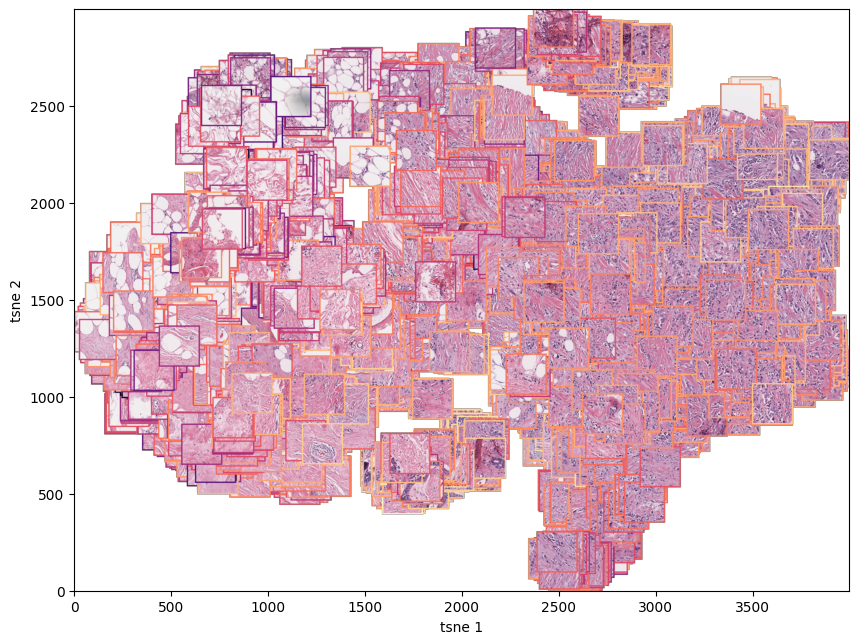

In [95]:
plt.figure(figsize=(10, 8))
plt.imshow(image)
plt.xlabel("tsne 1")
plt.ylabel("tsne 2")
plt.gca().invert_yaxis()  
#save_pt = f"{save_prefix}_tsne_HEoverlay_newcolor_border20.png"
#plt.savefig(fname = save_pt, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

### Scrapbook

In [5]:
attn_norm

array([0.84449417, 0.6932822 , 0.70537928, ..., 0.68077093, 0.54973011,
       0.52608411])

In [21]:
q1, q3 = wsi_df['attentions'].quantile([0.10, 0.9])
extremes = wsi_df[(wsi_df['attentions'] <= q1) | (wsi_df['attentions'] >= q3)]
extremes = extremes.sort_values('attentions')

In [22]:
extremes.head()

,keys,attentions,attn_norm
3016,b'85265_25042',-6.495708,0.0
219,b'18961_62674',-5.970938,0.0
40,b'12689_51922',-5.870422,0.0
3167,b'90641_24146',-5.113504,0.0
3114,b'88849_20562',-4.970606,0.0


In [23]:
def f(x):
    return 0 if x<=q1 else 1
    
extremes['cluster'] = extremes['attentions'].apply(lambda x: f(x))

In [24]:
def percentile_clip(x, lower=1, upper=99, eps=1e-8):
    low_val = np.percentile(attentions, lower)
    high_val = np.percentile(attentions, upper)
    x_clipped = np.clip(x, low_val, high_val)
    return (x_clipped - low_val) / (high_val - low_val + eps)

,keys,attentions,attn_norm,cluster
601,33297_18770,8.122718,1.0,1
634,35089_17874,8.132115,1.0,1
1993,69137_12498,8.136620,1.0,1
2538,76305_35794,8.152682,1.0,1
160,17169_55506,8.198958,1.0,1


In [27]:
extremes.head()

,keys,attentions,attn_norm,cluster
3016,85265_25042,-6.495708,0.0,0
219,18961_62674,-5.970938,0.0,0
40,12689_51922,-5.870422,0.0,0
3167,90641_24146,-5.113504,0.0,0
3114,88849_20562,-4.970606,0.0,0


In [31]:
embeds = np.stack(vecs)

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 648 samples in 0.001s...
[t-SNE] Computed neighbors for 648 samples in 0.068s...
[t-SNE] Computed conditional probabilities for sample 648 / 648
[t-SNE] Mean sigma: 11.249198
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.982109
[t-SNE] KL divergence after 1000 iterations: 0.797394


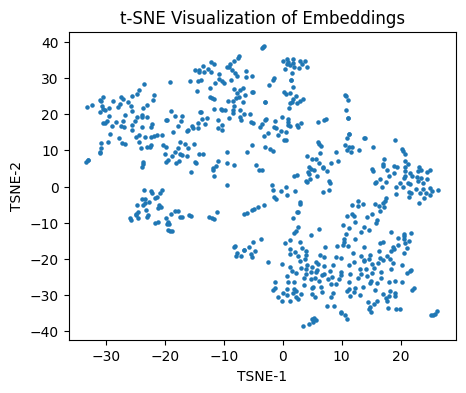

In [33]:
extremes['tsne_x'] = embeddings_2d[:, 0]
extremes['tsne_y'] = embeddings_2d[:, 1]

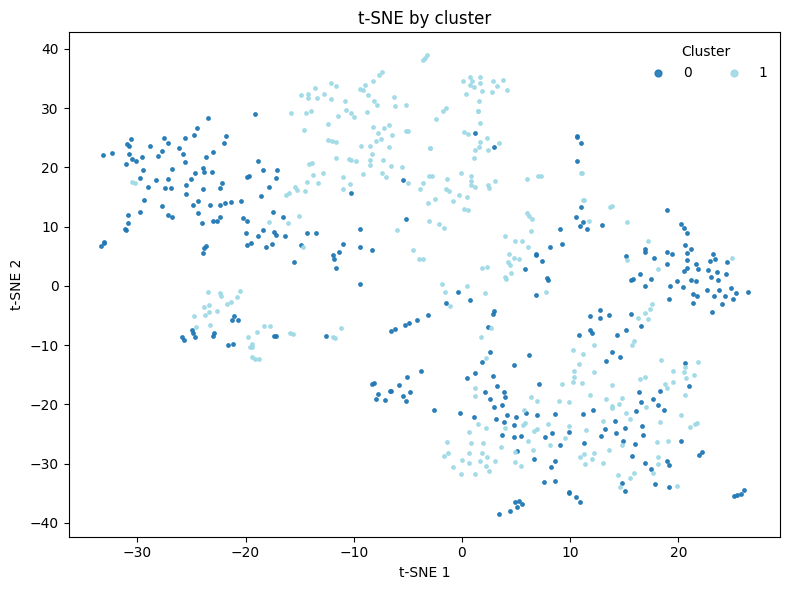

In [34]:
clusters = sorted(extremes['cluster'].unique())
cmap = plt.get_cmap('tab20', len(clusters))  # tab10/tab20 are good categorical maps

ig, ax = plt.subplots(figsize=(8,6))
for i, c in enumerate(clusters):
    m = extremes['cluster'] == c
    ax.scatter(
        extremes.loc[m, 'tsne_x'], extremes.loc[m, 'tsne_y'],
        s=6, alpha=0.9, label=str(c), color=cmap(i), rasterized=True
    )

ax.set(title='t-SNE by cluster', xlabel='t-SNE 1', ylabel='t-SNE 2')
ax.legend(title='Cluster', markerscale=2, frameon=False, ncol=2)
plt.tight_layout()
plt.show()

In [19]:
wsi_path = '/SAN/colcc/Hormad1/data/WSIs/pantcga/TCGA-BH-A0C1-01Z-00-DX1.21FE357E-B182-4397-BFEF-7E96E994236A.svs'

In [ ]:
plt.figure(figsize=(5, 4))
plt.scatter(t[:, 0], t[:, 1])
plt.title("t-SNE Visualization of Embeddings")
plt.xlabel("TSNE-1")
plt.ylabel("TSNE-2")
plt.show()

In [ ]:
#sampled_df = df.groupby('category', group_keys=False).apply(lambda x: x.sample(frac=0.5, random_state=42))
#sampled = test[np.random.choice(test.shape[0], size=5000, replace=False)]

In [ ]:
#df_shuf = df.sample(frac=1, random_state=42).reset_index(drop=True)
#df_shuf['keys'] = df_shuf['keys'].apply(lambda x: x[2:-1])
#df_shuf.tail()